In [4]:
import numpy as np
import pandas as pd
import seaborn as sns
#import anndata
#import scanpy as sc
import os
print(os.getpid())
#sc.settings.n_jobs = 24
#sc.settings.set_figure_params(dpi=180, dpi_save=300, frameon=False, figsize=(4, 4), fontsize=8, facecolor='white')

451548


In [5]:
merlin_output_folder = r'J:\MERFISH_Analysis\0624-P_Forebrain_smFISH_old'

In [6]:
cell_meta_data_file = os.path.join(merlin_output_folder, 'ExportCellMetadata', 'feature_metadata.csv')
cell_meta_data = pd.read_csv(cell_meta_data_file).set_index('Unnamed: 0')


In [7]:
print(cell_meta_data_file)

J:\MERFISH_Analysis\0624-P_Forebrain_smFISH_old\ExportCellMetadata\feature_metadata.csv


In [8]:
cell_meta_data

,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y
Unnamed: 0,,,,,,,,
100775698266031785284033406114783472476,0,175.253125,-1849.370020,5736.391806,-1855.482820,-1843.257219,5732.277006,5740.506606
104217748736003930455827173602635986370,0,0.380946,-1862.006020,5872.579809,-1862.502820,-1861.509220,5872.137009,5873.022609
10526418252038133878463183937336933654,0,1103.988559,-1842.026019,5722.189805,-1851.378820,-1832.673219,5715.429005,5728.950606
10533038462139636550886376074481316909,0,41.017158,-1960.880022,5822.089808,-1963.158823,-1958.601222,5819.973008,5824.206608
105812017010320510777735406285755970427,0,147.999255,-1914.818021,5711.227805,-1918.770821,-1910.865221,5708.301005,5714.154605
...,...,...,...,...,...,...,...,...
95264460735839175428420118699116607221,89,183.599418,1486.871956,3476.048004,1483.081156,1490.662756,3472.149204,3479.946804
96368421518763644709130816273314717315,89,235.428404,1401.929954,3466.544004,1394.845154,1409.014754,3459.297204,3473.790804
96583521568197661143594593699899102436,89,43.522469,1493.675956,3376.634002,1491.181156,1496.170756,3374.625202,3378.642802


In [9]:
sum_layers = [1,4,7,10]
sum_signal_data_dict = {}
for _ly in sum_layers:
    # load sum signal for sequential rounds
    sum_signal_data_file = os.path.join(merlin_output_folder, f'ExportSumSignals{_ly}', 'sequential_sum_signals.csv')
    sum_signal_data = pd.read_csv(sum_signal_data_file).rename(columns={'Unnamed: 0':'index'}).set_index('index')
    sum_signal_data_dict[_ly] = sum_signal_data

In [10]:
sum_signal_data_dict[10]

# take mean
for _name in list(sum_signal_data_dict.values())[0].columns:
    df = pd.DataFrame()
    #df.index = list(sum_signal_data_dict.values())[0].index
    _df_list = []
    for _ly, _df in sum_signal_data_dict.items():
        _df_list.append(_df[_name])
    # summarize
    _df = pd.concat(_df_list, axis=1)
    _df[f'mean_{_name}'] = np.nanmean(_df[_name], axis=1)
    # append into cell data
    cell_meta_data[_name] = _df[f'mean_{_name}']

<ipython-input-10-92194dd31706>:12: RuntimeWarning: Mean of empty slice
  _df[f'mean_{_name}'] = np.nanmean(_df[_name], axis=1)


In [17]:
# remove cells with volume smaller than threshold
volume_th = 100
cell_data = cell_meta_data.copy()
cell_data = cell_data.loc[cell_data['volume']>=volume_th]

In [18]:
# for each fov_id, add order
cell_data['cell_mask_id'] = np.nan
for _fov_id in np.unique(cell_data['fov']):
    cell_data.loc[cell_data['fov'] == _fov_id, 'cell_mask_id'] = (np.arange(np.sum(cell_data['fov'] == _fov_id))+1).astype(np.int)

In [19]:
cell_data

,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y,Slc17a7,Slc32a1,SST,polyT,DAPI,cell_mask_id
Unnamed: 0,,,,,,,,,,,,,,
100775698266031785284033406114783472476,0,175.253125,-1849.370020,5736.391806,-1855.482820,-1843.257219,5732.277006,5740.506606,16934.159487,15276.203141,11902.641798,22734.590723,1292.733047,1.0
10526418252038133878463183937336933654,0,1103.988559,-1842.026019,5722.189805,-1851.378820,-1832.673219,5715.429005,5728.950606,23207.523246,15721.050917,10966.145877,22384.805561,1402.229466,2.0
105812017010320510777735406285755970427,0,147.999255,-1914.818021,5711.227805,-1918.770821,-1910.865221,5708.301005,5714.154605,18446.812300,12981.995894,9481.758368,14884.581481,1006.773922,3.0
109033937176471801290897929939691922101,0,240.133487,-1821.722019,5696.869205,-1825.782819,-1817.661219,5693.299805,5700.438605,14633.277580,10795.224070,8442.666129,9475.229253,1266.765899,4.0
112147596429579479190512194465941472127,0,353.176840,-1899.590021,5708.149805,-1904.406821,-1894.773221,5704.953005,5711.346605,32618.558433,14772.441266,9917.915063,15656.083251,2186.320625,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87963648343411551819530139408030030194,89,770.960230,1450.799955,3360.704001,1443.985155,1457.614755,3351.837201,3369.570802,NaN,NaN,NaN,NaN,NaN,137.0
88971408365122114616233985709878039928,89,315.467010,1400.687954,3348.554001,1395.061154,1406.314754,3342.333201,3354.774801,NaN,NaN,NaN,NaN,NaN,138.0
93729489897498081041398157238903502101,89,1004.171541,1322.333952,3325.874000,1316.005152,1328.662752,3319.113200,3332.634801,NaN,NaN,NaN,NaN,NaN,139.0


In [16]:
cell_data_savefile = os.path.join(save_folder, 'cell_data.csv')
if not os.path.exists(cell_data_savefile):
    cell_data.to_csv(cell_data_savefile)

NameError: name 'save_folder' is not defined

<AxesSubplot:xlabel='volume', ylabel='Count'>

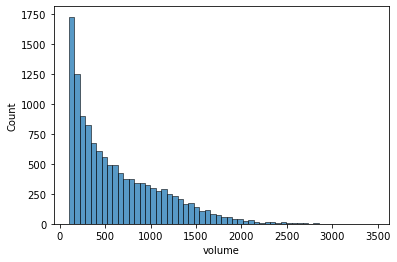

In [20]:
sns.histplot(cell_data['volume'])#, binrange=[8, 11])


<AxesSubplot:xlabel='Slc17a7', ylabel='Count'>

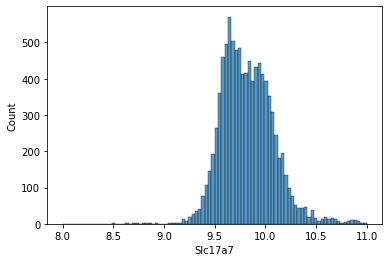

In [22]:
sns.histplot(np.log(cell_data['Slc17a7']), binrange=[8, 11])


<AxesSubplot:xlabel='Slc32a1', ylabel='Count'>

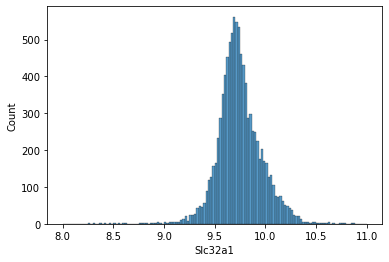

In [23]:
sns.histplot(np.log(cell_data['Slc32a1']), binrange=[8, 11])


<AxesSubplot:xlabel='SST', ylabel='Count'>

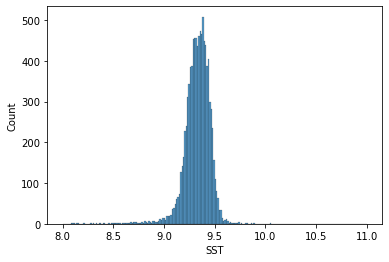

In [24]:
sns.histplot(np.log(cell_data['SST']), binrange=[8, 11])

In [29]:
figure_folder = r'\\10.245.74.158\Chromatin_NAS_5\20210624-P_Forebrain_smFISH_CTP09\Analysis\20210902-figures'

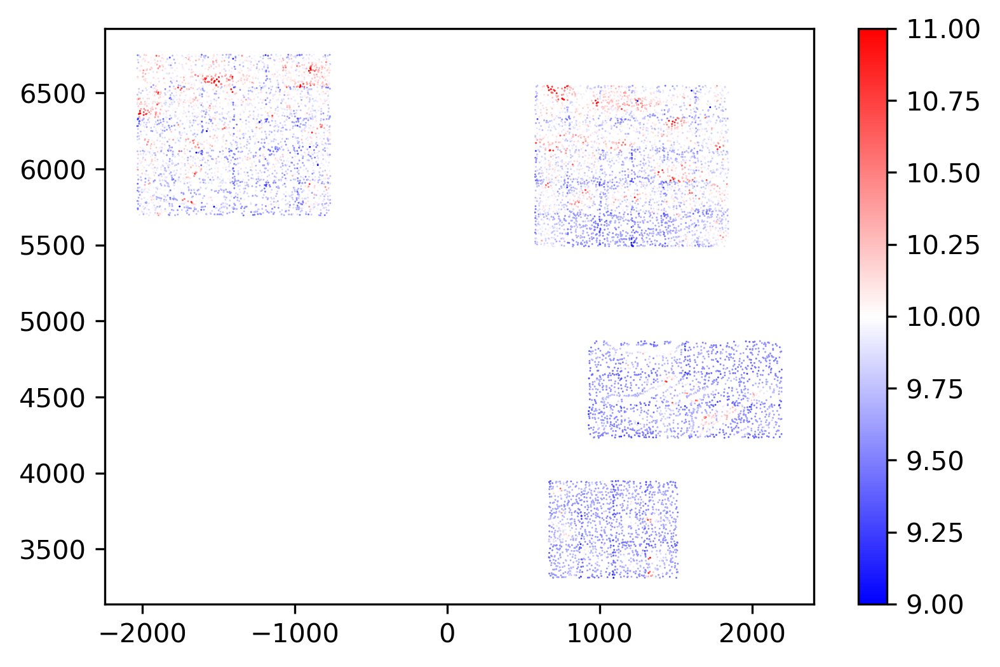

In [30]:
gene_name = 'Slc17a7'

import matplotlib.pyplot as plt
fig, ax = plt.subplots()
fig.set_dpi(300)
_p = ax.scatter(cell_data['center_x'], cell_data['center_y'], marker='.', edgecolors='none',
            cmap='bwr', c=np.log(cell_data[gene_name]), s=2, 
            vmin=9, vmax=11, )
plt.colorbar(_p)
ax.axis('equal')
plt.savefig(os.path.join(figure_folder, f'{gene_name}_mosiac.png'), transparent=True)

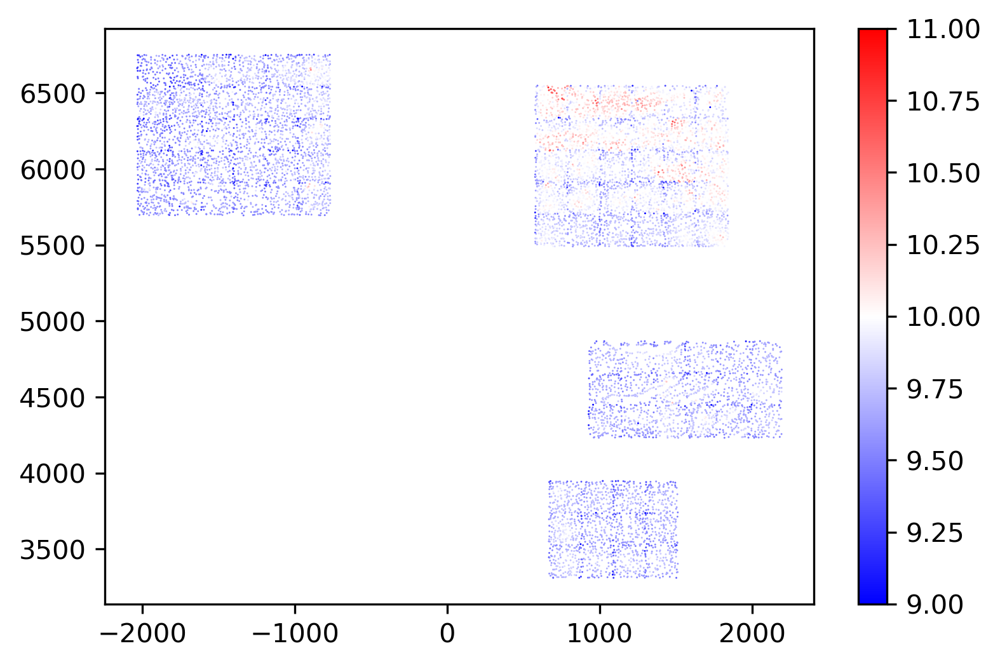

In [33]:
gene_name = 'Slc32a1'

import matplotlib.pyplot as plt
fig, ax = plt.subplots()
fig.set_dpi(300)
_p = ax.scatter(cell_data['center_x'], cell_data['center_y'], marker='.', edgecolors='none',
            cmap='bwr', c=np.log(cell_data[gene_name]), s=2, 
            vmin=9, vmax=11, )
plt.colorbar(_p)
ax.axis('equal')
plt.savefig(os.path.join(figure_folder, f'{gene_name}_mosiac.png'), transparent=True)

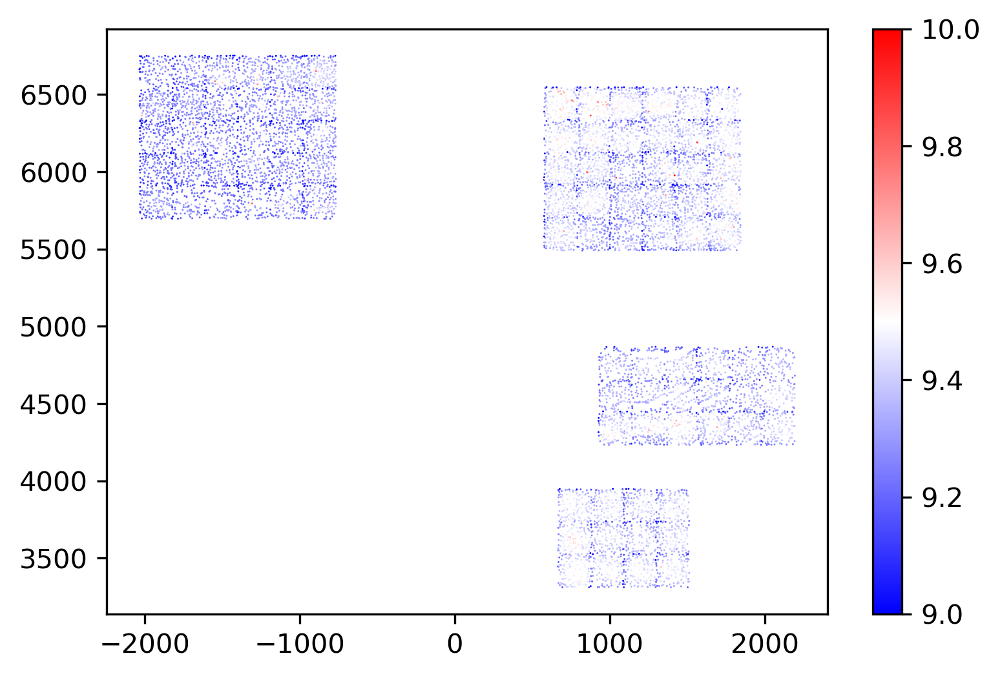

In [34]:
gene_name = 'SST'

import matplotlib.pyplot as plt
fig, ax = plt.subplots()
fig.set_dpi(300)
_p = ax.scatter(cell_data['center_x'], cell_data['center_y'], marker='.', edgecolors='none',
            cmap='bwr', c=np.log(cell_data[gene_name]), s=2, 
            vmin=9, vmax=10, )
plt.colorbar(_p)
ax.axis('equal')
plt.savefig(os.path.join(figure_folder, f'{gene_name}_mosiac.png'), transparent=True)

# visualization of segmentation results

In [18]:
fov_id = 2
segmentation_file = os.path.join(merlin_output_folder, 'WatershedSegment', 'features', f'feature_data_{fov_id}.hdf5')

In [319]:
import h5py
import sys
sys.path.append(r'E:\Users\puzheng\Documents\Merfish_analysis\MERlin')

from merlin.util.spatialfeature import HDF5SpatialFeatureDB

In [24]:
_info

<Closed HDF5 group>

In [435]:
features = []
with h5py.File(segmentation_file, "r", libver='latest') as _f:
    _grp = _f['featuredata']
    print(_grp)
    for _i, _cell_id in enumerate(_grp.keys()):
        _info = _grp[_cell_id]
        #rint(list(_info.attrs.keys()))
        print(_info.attrs['id'], _i, loadedFeature.get_volume())
        #rint(_info['z_coordinates'][:])
        loadedFeature = HDF5SpatialFeatureDB._load_feature_from_hdf5_group(_info)
        features.append(loadedFeature)
        


<HDF5 group "/featuredata" (316 members)>
b'100027100358130192483695995426422130157' 0 24.66819487973943
b'101919737850217925126796945725351534047' 1 3.334037932963603
b'102575352007310164945663888723545329492' 2 993.9101368421843
b'104672572954556231940654182681316776318' 3 338.9245980627692
b'105478927105127244946020383314461024419' 4 0.8939290063753516
b'106088737679827598548703306284326888140' 5 21.040574051545303
b'106918450005361611485458866828618244233' 6 9.619068019019116
b'108359866180430067865610412993323612512' 7 0.0025660801331233996
b'108449242166434957831975009377149461328' 8 177.15972295071245
b'108466433434336020770703532716517077133' 9 3.152079523523943
b'109041335534431527019245759106364042863' 10 79.30738923431784
b'109293273497547958429746277853258735570' 11 513.3400149511123
b'110971274600822094964771626229485549205' 12 17.486553067169407
b'111292899693548702741107564525100753407' 13 20.010292878096266
b'113789387189003177896104291398190052836' 14 1023.659753585537

b'237601411548346511205416452722138820409' 137 1817.2567763558543
b'238114489303139483560833959300085538434' 138 852.915814167664
b'238401971656044306834983976729506086467' 139 0.2405116924772932
b'240475840143711573336992931608687489183' 140 356.8473847525694
b'241481778288772554054134057990196186372' 141 1031.823620889064
b'242748724170720192190609808513626021655' 142 0.28740097490982086
b'24300264097428550076665497696645458785' 143 1866.5048696307533
b'246375940792794586509028181225437460091' 144 487.5745875344504
b'247111502616379929387132239464567473632' 145 36.9366239962024
b'247162191115795615955023473537345706446' 146 1366.0658225489192
b'248138956044786472389907819576384568921' 147 3.0783630396996706
b'248547290224854472335108925355682866840' 148 1542.729708833909
b'249016218417240167761890844851299674779' 149 1881.317100639185
b'249511529321598057479584202800689819' 150 4.064437650855363
b'249823744753686038873580844560304260546' 151 1587.018968891552
b'2510615835652640624683

b'55346411932208318865726982746089903302' 271 50.968066804127204
b'5656979162866095593945850923002326151' 272 1217.4890830010381
b'56819829226894809398452500601935628411' 273 18.740549772224384
b'58041945812372965897454478176474098556' 274 345.21312734900636
b'58260470846586570047272363411129692888' 275 5.38211979921423
b'58562984664918994747613677678299240660' 276 0.5813337901585011
b'5872739181034494571890047357309889917' 277 21.365416468397527
b'59305505819798770255422681794322344484' 278 3.310943211765493
b'6227015902978603329375637964001467060' 279 5.119329865581182
b'62340579362024768618964652638287750394' 280 33.42832589419852
b'63373825562597663658198948986304977378' 281 1225.5694360602322
b'64843588178851074661811499964090308778' 282 342.20124911275565
b'65533502498383581225745801463184831659' 283 619.5175290994014
b'66234739122957848752615047401925603600' 284 0.058553283037633935
b'67339891991089701269253645191159128113' 285 340.46949494291545
b'673712021558432453341546288181

In [173]:
test_positions = np.array([[1,2,0]])#.transpose()

In [174]:
loadedFeature.contains_positions(test_positions,)

array([False])

[[],

In [194]:
polygon = loadedFeature.get_boundaries()[5][0]
polygon.area

39.55985773229079

In [204]:
type(polygon)

shapely.geometry.polygon.Polygon

In [206]:
import shapely
import numpy as np


In [315]:
def convert_polygon_into_mask(polygon:shapely.geometry.polygon.Polygon,
                              fov_center:np.ndarray,
                              microns_per_pixel:float=0.108,
                              image_size:np.ndarray=np.array([2048,2048]),
    ):
    """function to convert a layer of segmentation polygon into mask"""
    from matplotlib.path import Path
    # extract vertices coordniates
    poly_coordinates = np.round((np.array(list(polygon.exterior.coords)) - fov_center)/0.108)
    # generate path
    poly_path = Path(poly_coordinates)
    # generate meshgrid 
    x, y = np.meshgrid(np.arange(image_size[0]),np.arange(image_size[1]))
    x, y = x.flatten(), y.flatten()
    points = np.vstack((x,y)).T
    # extract all internal pixels, assign to be 1
    mask = poly_path.contains_points(points)
    mask = mask.reshape((image_size[0], image_size[1])).astype(np.uint16)
    
    return mask

def convert_boundary_into_mask(boundary:list,
                               fov_center:np.ndarray,
                               microns_per_pixel:float=0.108,
                               image_size:np.ndarray=np.array([2048,2048]),
                               ):
    """function to convert multiple polygon from the same cell into single 2d mask"""
    # initialize
    _mask = np.zeros(image_size, dtype=np.uint16)
    for _polygon in boundary:
        _mask += convert_polygon_into_mask(_polygon, fov_center=fov_center,
                                           microns_per_pixel=microns_per_pixel, image_size=image_size)
    
    return _mask


In [331]:
def convert_segmentation_feature_into_mask(segmentation_file,
                                           fov_center:np.ndarray,
                                           target_z_coordinates:np.ndarray=None,
                                           microns_per_pixel:float=0.108,
                                           image_size:np.ndarray=np.array([2048,2048]),
                                           parallel=False,
                                           num_threads=12,
                                           ):
    """Assemble all layers,"""
    
    cell_id_list = []
    boundary_list = []
    z_coord_list = []
    
    with h5py.File(segmentation_file, "r", libver='latest') as _f:
        _grp = _f['featuredata']
        for _i, _cell_id in enumerate(_grp.keys()):
            _cell_grp = _grp[_cell_id]
            _cell = HDF5SpatialFeatureDB._load_feature_from_hdf5_group(_cell_grp)

            boundary_list.append(_cell.get_boundaries())
            z_coord_list.append(_cell.get_z_coordinates())
            cell_id_list.append(_cell_grp.attrs['id'])
            
    # process each z separately:
    z_masks = []
    z_coords = np.unique(np.concatenate(z_coord_list))
    for _z in z_coords:
        print(_z)
        # initialize z 
        _args = []
        _cell_indices = []
        for _icell, (_bds, _zcoords) in enumerate(zip(boundary_list, z_coord_list)):
            for _bd, _zc in zip(_bds, _zcoords):
                if _zc == _z:
                    _args.append((_bd, fov_center, microns_per_pixel, image_size))
                    _cell_indices.append(_icell)
        # proess this layer
        if parallel:
            import multiprocessing as mp
            with mp.Pool(num_threads) as _pool:
                _masks = _pool.starmap(convert_boundary_into_mask, _args, chunksize=1)
                _pool.close()
                _pool.join()
                _pool.terminate()
        else:
            _masks = [convert_boundary_into_mask(*_arg) for _arg in _args]        
        
        # summarize this layer
        _mask_layer = np.max([_msk*(_icell+1) for _msk,_icell in zip(_masks, _cell_indices)], axis=0)
        # append
        z_masks.append(_mask_layer)
    
    return z_masks
    
    # interpolate z in the middle
    if target_z_coordinates is None:
        _final_mask = np.array(z_masks)
        _final_coords = z_coords
    else:
        # target z
        _final_mask = []
        _final_coords = target_z_coordinates
        for _fz in _final_coords:
            if _fz in z_coords:
                _final_mask.append(z_masks[np.where(z_coords==_fz)[0][0]])
    
    
    return _final_mask, _final_coords

        
        

In [332]:
%%time
z_masks = convert_segmentation_feature_into_mask(segmentation_file, fov_center, parallel=True, num_threads=44)

0.0
1.0
2.0
3.0
4.0
5.0
6.0
7.0
8.0
9.0
10.0
11.0
Wall time: 15min 44s


In [345]:
with h5py.File(segmentation_file, "r", libver='latest') as _f:
    _grp = _f['featuredata']
    for _i, _cell_id in enumerate(_grp.keys()):
        _info = _grp[_cell_id]
        #print(list(_info.attrs.keys()))
        print(_info.attrs['id'], _info.attrs['volume'])
        loadedFeature = HDF5SpatialFeatureDB._load_feature_from_hdf5_group(_info)
        #print(_i, loadedFeature.get_volume())


b'100027100358130192483695995426422130157' 3.334037932963603
b'101919737850217925126796945725351534047' 993.9101368421843
b'102575352007310164945663888723545329492' 338.9245980627692
b'104672572954556231940654182681316776318' 0.8939290063753516
b'105478927105127244946020383314461024419' 21.040574051545303
b'106088737679827598548703306284326888140' 9.619068019019116
b'106918450005361611485458866828618244233' 0.0025660801331233996
b'108359866180430067865610412993323612512' 177.15972295071245
b'108449242166434957831975009377149461328' 3.152079523523943
b'108466433434336020770703532716517077133' 79.30738923431784
b'109041335534431527019245759106364042863' 513.3400149511123
b'109293273497547958429746277853258735570' 17.486553067169407
b'110971274600822094964771626229485549205' 20.010292878096266
b'111292899693548702741107564525100753407' 1023.6597535855377
b'113789387189003177896104291398190052836' 3.553321144339602
b'1138408644407032446165828183465780996' 551.6738695798003
b'11392964673940

b'248138956044786472389907819576384568921' 1542.729708833909
b'248547290224854472335108925355682866840' 1881.317100639185
b'249016218417240167761890844851299674779' 4.064437650855363
b'249511529321598057479584202800689819' 1587.018968891552
b'249823744753686038873580844560304260546' 976.2514231260835
b'251061583565264062468398509268374466047' 0.8610365246689513
b'251954845388521153349229239378677091187' 591.3560826784382
b'253662617108379254754346706419605718621' 10.370229657987966
b'254137572809837743291234826634766457616' 60.041959434863664
b'254185855991116322804368229559177159342' 98.93218689241532
b'25473481404891474577220776467957962295' 48.724962847759215
b'255421570428009630354541417966881443988' 139.13379793799913
b'256791218909420735469364564182581941114' 1.4815613568606107
b'257886817921400585980130898863176477742' 1656.5277811375386
b'260410216707160009768119823314404104658' 881.6724162195029
b'260800322261975974591815820954726434186' 1.4517015153115378
b'263084072836135927

b'68923068135656365449078268401220568760' 1350.93691392406
b'69824148055153607615305637857075342764' 4.3467064654989365
b'70373940796785206696421108527946993106' 39.507369729567856
b'72389034021404468154286929802794807703' 69.35414759796244
b'72516002971797064167761574847739641023' 1320.486524024351
b'7379931311309506618488911643103059895' 5.074773383269677
b'74490595728282007772508668216454040940' 5.681301414735207
b'77540183833397699750281293576779727178' 29.721506501895718
b'78231490437001567808962803689481321710' 3.247724328485815
b'79553892053638700715705526554745154309' 10.526760546108491
b'80581897731220325304189570769027025765' 1.5352157596440992
b'80680318966303119929730235247274739129' 19.214108196791713
b'81317370801128611266590230726245673847' 124.73738855114053
b'83065887019263908013791742801679351579' 2.475800768439876
b'83515971824287186598549731323261332596' 648.9959578286866
b'84719772351754437442801347134206244779' 0.2591740934454633
b'85872165530620069788997297715627

In [338]:
z_coords = np.arange(0,12)
mode='nearest'
# target z
_final_mask = []
_final_coords = np.round(np.arange(0,12,0.2), 2)
for _fz in _final_coords:
    if _fz in z_coords:
        _final_mask.append(z_masks[np.where(z_coords==_fz)[0][0]])
    else:
        if mode == 'nearest':
            print(z_coords[np.argmin(np.abs(z_coords-_fz))])
            _final_mask.append(z_masks[np.argmin(np.abs(z_coords-_fz))])
            continue
        # find nearest neighbors
        if np.sum(z_coords > _fz) > 0:
            _upper_z = np.min(z_coords[z_coords > _fz])
        else:
            _upper_z = np.max(z_coords)
        if np.sum(z_coords < _fz) > 0:
            _lower_z = np.max(z_coords[z_coords < _fz])
        else:
            _lower_z = np.min(z_coords)
        
        if _upper_z == _lower_z:
            # copy the closest mask to extrapolate
            _final_mask.append(z_masks[np.where(z_coords==_upper_z)[0][0]])
        else:
            # interploate
            _upper_mask = z_masks[np.where(z_coords==_upper_z)[0][0]].astype(np.float32)
            _lower_mask = z_masks[np.where(z_coords==_lower_z)[0][0]].astype(np.float32)
            _inter_mask = (_upper_z-_fz)/(_upper_z-_lower_z) * _lower_mask 
            print(_fz, _upper_z, _lower_z)
        




0
0
1
1
1
1
2
2
2
2
3
3
3
3
4
4
4
4
5
5
5
5
6
6
6
6
7
7
7
7
8
8
8
8
9
9
9
9
10
10
10
10
11
11
11
11
11
11


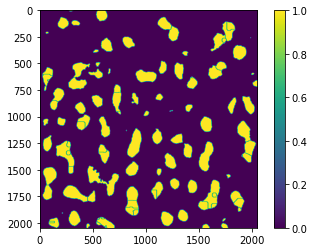

In [329]:
plt.figure()
plt.imshow(layer_mask, vmin=0, vmax=1)
plt.colorbar()
plt.show()

In [231]:
def convert_z_boundaries_into_3d_mask(boundaries:list,
                                      z_coordinates:np.ndarray,
                                      target_z_coordinates:np.ndarray,
                                      fov_center:np.ndarray,
                                      microns_per_pixel:float=0.108,
                                      image_size:np.ndarray=np.array([2048,2048]),
    ):
    """Function to concatenate all 2d masks and generate a 3d mask for one cell"""
    # check inputs
    if len(boundaries) != len(z_coordinates):
        raise IndexError(f"length of boundaries and z_coordinates doesnt match!")
    # generate z layers
    _mask_layers = []
    for _z, _bds in zip(z_coordinates, boundaries):
        print(_z)
        _masks = []
        if len(_bds) == 0:
            _mask_layers.append(np.zeros(image_size).astype(np.uint16))
        else:
            for _polygon in _bds:
                _mask = convert_polygon_into_mask(_polygon, fov_center=fov_center,
                                                  microns_per_pixel=microns_per_pixel,
                                                  image_size=image_size)
                _masks.append(_mask)
            _mask_layers.append(np.array(_masks).max(0).astype(np.uint16))
    
    return _mask_layers

In [485]:
from importlib import reload
import merlin.util.spatialfeature
reload(merlin.util.spatialfeature)
from merlin.util.spatialfeature import convert_z_boundaries_into_3d_mask

In [486]:
convert_z_boundaries_into_3d_mask

<function merlin.util.spatialfeature.convert_z_boundaries_into_3d_mask(boundaries: list, z_coordinates: numpy.ndarray, target_z_coordinates: numpy.ndarray, fov_center: numpy.ndarray, microns_per_pixel: float = 0.108, image_size: numpy.ndarray = array([2048, 2048]))>

In [ ]:
positions = np.loadtxt(r'\\10.245.74.158\Chromatin_NAS_5\20210624-P_Forebrain_smFISH_CTP09\positions\positions_all.txt',
                       delimiter=',')

fov_ids = [0,2,3,4,5,6,7,63,64,66,67,68,70,83,84,85,86,87,88, 
           11,12,13,14,15,16,17,18,21,22,23,24,25,26,27,28,30,31,32,33,34,35,36,37,38,39]

#fov_ids = [21,22,23,24,25,26,27,28,30,31,32,33,34,35,36,37,38,39]

for fov_id in fov_ids:
    fov_center = positions[fov_id]
    segmentation_file = os.path.join(merlin_output_folder, 'WatershedSegment', 'features', f'feature_data_{fov_id}.hdf5')
    import time
    _start = time.time()
    final_mask = convert_shape_into_mask(segmentation_file, fov_center, parallel=True, num_threads=44)
    print(time.time()-_start)

    save_folder = r'\\10.245.74.158\Chromatin_NAS_5\20210624-P_Forebrain_smFISH_CTP09\Analysis\segmentation_new'
    save_filename = os.path.join(save_folder, os.path.basename(segmentation_file).replace('.hdf5', ""))
    print(save_filename)
    np.save(save_filename, final_mask)

784.9016122817993
\\10.245.74.158\Chromatin_NAS_5\20210624-P_Forebrain_smFISH_CTP09\Analysis\segmentation_new\feature_data_0
666.6234910488129
\\10.245.74.158\Chromatin_NAS_5\20210624-P_Forebrain_smFISH_CTP09\Analysis\segmentation_new\feature_data_2
665.5617065429688
\\10.245.74.158\Chromatin_NAS_5\20210624-P_Forebrain_smFISH_CTP09\Analysis\segmentation_new\feature_data_3
738.9704124927521
\\10.245.74.158\Chromatin_NAS_5\20210624-P_Forebrain_smFISH_CTP09\Analysis\segmentation_new\feature_data_4
710.4030961990356
\\10.245.74.158\Chromatin_NAS_5\20210624-P_Forebrain_smFISH_CTP09\Analysis\segmentation_new\feature_data_5
672.8491415977478
\\10.245.74.158\Chromatin_NAS_5\20210624-P_Forebrain_smFISH_CTP09\Analysis\segmentation_new\feature_data_6
702.6133134365082
\\10.245.74.158\Chromatin_NAS_5\20210624-P_Forebrain_smFISH_CTP09\Analysis\segmentation_new\feature_data_7
767.9309558868408
\\10.245.74.158\Chromatin_NAS_5\20210624-P_Forebrain_smFISH_CTP09\Analysis\segmentation_new\feature_data_63

In [495]:
segmentation_file

'J:\\MERFISH_Analysis\\0624-P_Forebrain_smFISH_old\\WatershedSegment\\features\\feature_data_39.hdf5'

In [496]:
with h5py.File(segmentation_file, "r", libver='latest') as _f:
    _grp = _f['featuredata']
    for _i, _cell_id in enumerate(_grp.keys()):
        
        if _cell_id in cell_data.index:
            print(int(cell_data.loc[cell_data.index==_cell_id, 'cell_mask_id']))

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257


In [497]:
def convert_shape_into_mask(segmentation_file,
                            fov_center:np.ndarray,
                            microns_per_pixel:float=0.108,
                            image_size:np.ndarray=np.array([2048,2048]),
                            parallel=False,
                            num_threads=12,
                            ):
    """"""
    
    cell_id_list = []
    boundary_list = []
    z_coord_list = []
    
    with h5py.File(segmentation_file, "r", libver='latest') as _f:
        _grp = _f['featuredata']
        for _i, _cell_id in enumerate(_grp.keys()):
            if _cell_id in cell_data.index:
                #print(cell_data.loc[cell_data.index==_cell_id, 'cell_mask_id'])
                _cell_grp = _grp[_cell_id]
                _cell = HDF5SpatialFeatureDB._load_feature_from_hdf5_group(_cell_grp)
                boundary_list.append(_cell.get_boundaries())
                z_coord_list.append(_cell.get_z_coordinates())
                cell_id_list.append(int(cell_data.loc[cell_data.index==_cell_id, 'cell_mask_id']))

    # process boundary into mask
    _args = [(_bds, _zcoords, np.arange(0,12,0.2), fov_center, microns_per_pixel, image_size)
             for _bds, _zcoords in zip(boundary_list, z_coord_list)]

    if parallel:
        import multiprocessing as mp
        with mp.Pool(num_threads) as _pool:
            _masks = _pool.starmap(convert_z_boundaries_into_3d_mask, _args, chunksize=1)
            _pool.close()
            _pool.join()
            _pool.terminate()
    else:
        _masks = [convert_z_boundaries_into_3d_mask(*_arg) for _arg in _args]
    
    #return _masks
    _final_mask = np.max([_msk*_id for _id, _msk in zip(cell_id_list, _masks)], axis=0)
    #
    return _final_mask

In [311]:
import time
_start = time.time()
final_mask = convert_shape_into_mask(segmentation_file, fov_center, parallel=True, num_threads=44)
print(time.time()-_start)

791.1322441101074


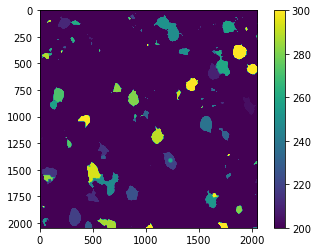

In [363]:
plt.figure()
plt.imshow(np.max(final_mask, axis=0), vmin=200, vmax=300)
plt.colorbar()
plt.show()

In [314]:
save_folder = r'\\10.245.74.158\Chromatin_NAS_5\20210624-P_Forebrain_smFISH_CTP09\Analysis\segmentation'
np.save(os.path.join(save_folder, os.path.basename(segmentation_file).replace('.hdf5', "")), 
        final_mask)

In [280]:
segmentation_file

'J:\\MERFISH_Analysis\\0624-P_Forebrain_smFISH\\WatershedSegment\\features\\feature_data_1.hdf5'

In [285]:
os.path.basename(segmentation_file).replace('.hdf5', "")

'feature_data_1'

In [286]:
?np.save

In [232]:
mask_layers = convert_z_boundaries_into_3d_mask(loadedFeature.get_boundaries(),
                                                loadedFeature.get_z_coordinates(),
                                                np.arange(0,12,0.2),
                                                fov_center,
                                                )


0.0
1.0
2.0
3.0
4.0
5.0
6.0
7.0
8.0
9.0
10.0
11.0


In [235]:
import scipy

In [ ]:
scipy.

In [ ]:
scipy.interpolate.LinearNDInterpolator

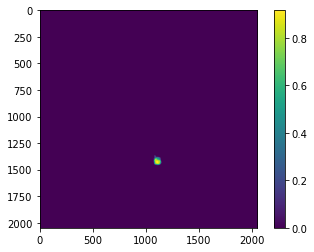

In [234]:
plt.figure()
plt.imshow(np.mean(mask_layers, axis=0))
plt.colorbar()
plt.show()

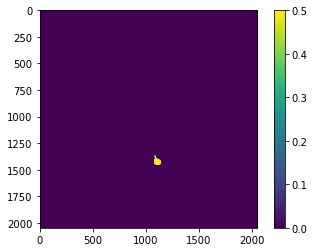

In [203]:
plt.figure()
plt.imshow(grid.astype(np.float), vmin=0, vmax=0.5)
plt.colorbar()
plt.show()

In [126]:
fov_center = np.array([-2035.40, 5903.30])

In [122]:


points = np.vstack((x,y)).T

path = Path(poly_verts)
grid = path.contains_points(points)
grid = grid.reshape((ny,nx))

NameError: name 'poly_verts' is not defined

In [121]:
poly_path

Path(array([[-1899.30922088,  6018.64380768],
       [-1899.32002088,  6018.63300768],
       [-1899.41722089,  6018.53580768],
       [-1899.41722089,  6018.42780767],
       [-1899.41722089,  6018.31980767],
       [-1899.42802089,  6018.30900767],
       [-1899.52522089,  6018.21180767],
       [-1899.52522089,  6018.10380767],
       [-1899.52522089,  6017.99580766],
       [-1899.52522089,  6017.88780766],
       [-1899.52522089,  6017.77980766],
       [-1899.52522089,  6017.67180765],
       [-1899.52522089,  6017.56380765],
       [-1899.52522089,  6017.45580765],
       [-1899.52522089,  6017.34780765],
       [-1899.52522089,  6017.23980764],
       [-1899.52522089,  6017.13180764],
       [-1899.53602089,  6017.12100764],
       [-1899.64402089,  6017.12100764],
       [-1899.7520209 ,  6017.12100764],
       [-1899.7628209 ,  6017.13180764],
       [-1899.7628209 ,  6017.23980764],
       [-1899.7628209 ,  6017.34780765],
       [-1899.7628209 ,  6017.45580765],
       [-18

In [89]:
poly_coordinates = np.array(list(polygon.exterior.coords))

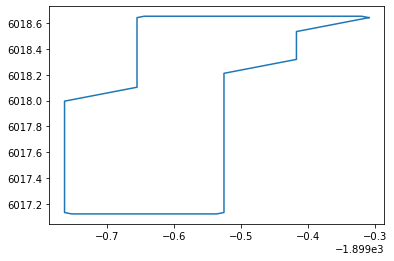

In [91]:
plt.plot(poly_coordinates[:,0], poly_coordinates[:,1])

In [95]:
import rasterio

ImportError: DLL load failed while importing _base: The specified procedure could not be found.

In [96]:
import rasterio.features
import matplotlib.pyplot as plt

poly = Polygon([(0, 50), (10, 10), (30, 0), (45, 45), (0, 50)])
img = rasterio.features.rasterize([poly], out_shape=(60, 50))

ModuleNotFoundError: No module named 'rasterio'

In [60]:
with h5py.File(segmentation_file, "r", libver='latest') as _f:
    _grp = _f['featuredata']
    print(_grp)
    for _cell_id in _grp.keys():
        _info = _grp[_cell_id]
        print(_info['z_coordinates'][:])
        for _key in _info.keys():
            print(_key)
            print(list(_info['zIndex_5'].keys()))
            

<HDF5 group "/featuredata" (310 members)>
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11.]
zIndex_0
['p_0']
zIndex_1
['p_0']
zIndex_10
['p_0']
zIndex_11
['p_0']
zIndex_2
['p_0']
zIndex_3
['p_0']
zIndex_4
['p_0']
zIndex_5
['p_0']
zIndex_6
['p_0']
zIndex_7
['p_0']
zIndex_8
['p_0']
zIndex_9
['p_0']
z_coordinates
['p_0']
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11.]
zIndex_0
['p_0']
zIndex_1
['p_0']
zIndex_10
['p_0']
zIndex_11
['p_0']
zIndex_2
['p_0']
zIndex_3
['p_0']
zIndex_4
['p_0']
zIndex_5
['p_0']
zIndex_6
['p_0']
zIndex_7
['p_0']
zIndex_8
['p_0']
zIndex_9
['p_0']
z_coordinates
['p_0']
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11.]
zIndex_0
['p_0']
zIndex_1
['p_0']
zIndex_10
['p_0']
zIndex_11
['p_0']
zIndex_2
['p_0']
zIndex_3
['p_0']
zIndex_4
['p_0']
zIndex_5
['p_0']
zIndex_6
['p_0']
zIndex_7
['p_0']
zIndex_8
['p_0']
zIndex_9
['p_0']
z_coordinates
['p_0']
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11.]
zIndex_0
['p_0']
zIndex_1
['p_0']
zIndex_10
['p_0']
zIndex_11
['p_0']
zInd

zIndex_0
['p_0']
zIndex_1
['p_0']
zIndex_10
['p_0']
zIndex_11
['p_0']
zIndex_2
['p_0']
zIndex_3
['p_0']
zIndex_4
['p_0']
zIndex_5
['p_0']
zIndex_6
['p_0']
zIndex_7
['p_0']
zIndex_8
['p_0']
zIndex_9
['p_0']
z_coordinates
['p_0']
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11.]
zIndex_0
['p_0']
zIndex_1
['p_0']
zIndex_10
['p_0']
zIndex_11
['p_0']
zIndex_2
['p_0']
zIndex_3
['p_0']
zIndex_4
['p_0']
zIndex_5
['p_0']
zIndex_6
['p_0']
zIndex_7
['p_0']
zIndex_8
['p_0']
zIndex_9
['p_0']
z_coordinates
['p_0']
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11.]
zIndex_0
['p_0']
zIndex_1
['p_0']
zIndex_10
['p_0']
zIndex_11
['p_0']
zIndex_2
['p_0']
zIndex_3
['p_0']
zIndex_4
['p_0']
zIndex_5
['p_0']
zIndex_6
['p_0']
zIndex_7
['p_0']
zIndex_8
['p_0']
zIndex_9
['p_0']
z_coordinates
['p_0']
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11.]
zIndex_0
['p_0']
zIndex_1
['p_0']
zIndex_10
['p_0']
zIndex_11
['p_0']
zIndex_2
['p_0']
zIndex_3
['p_0']
zIndex_4
['p_0']
zIndex_5
['p_0']
zIndex_6
['p_0']
zIndex_7
['

[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11.]
zIndex_0
['p_0']
zIndex_1
['p_0']
zIndex_10
['p_0']
zIndex_11
['p_0']
zIndex_2
['p_0']
zIndex_3
['p_0']
zIndex_4
['p_0']
zIndex_5
['p_0']
zIndex_6
['p_0']
zIndex_7
['p_0']
zIndex_8
['p_0']
zIndex_9
['p_0']
z_coordinates
['p_0']
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11.]
zIndex_0
[]
zIndex_1
[]
zIndex_10
[]
zIndex_11
[]
zIndex_2
[]
zIndex_3
[]
zIndex_4
[]
zIndex_5
[]
zIndex_6
[]
zIndex_7
[]
zIndex_8
[]
zIndex_9
[]
z_coordinates
[]
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11.]
zIndex_0
[]
zIndex_1
[]
zIndex_10
[]
zIndex_11
[]
zIndex_2
[]
zIndex_3
[]
zIndex_4
[]
zIndex_5
[]
zIndex_6
[]
zIndex_7
[]
zIndex_8
[]
zIndex_9
[]
z_coordinates
[]
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11.]
zIndex_0
['p_0', 'p_1']
zIndex_1
['p_0', 'p_1']
zIndex_10
['p_0', 'p_1']
zIndex_11
['p_0', 'p_1']
zIndex_2
['p_0', 'p_1']
zIndex_3
['p_0', 'p_1']
zIndex_4
['p_0', 'p_1']
zIndex_5
['p_0', 'p_1']
zIndex_6
['p_0', 'p_1']
zIndex_7
['p_0', 'p_1']
zInd

[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11.]
zIndex_0
['p_0']
zIndex_1
['p_0']
zIndex_10
['p_0']
zIndex_11
['p_0']
zIndex_2
['p_0']
zIndex_3
['p_0']
zIndex_4
['p_0']
zIndex_5
['p_0']
zIndex_6
['p_0']
zIndex_7
['p_0']
zIndex_8
['p_0']
zIndex_9
['p_0']
z_coordinates
['p_0']
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11.]
zIndex_0
['p_0']
zIndex_1
['p_0']
zIndex_10
['p_0']
zIndex_11
['p_0']
zIndex_2
['p_0']
zIndex_3
['p_0']
zIndex_4
['p_0']
zIndex_5
['p_0']
zIndex_6
['p_0']
zIndex_7
['p_0']
zIndex_8
['p_0']
zIndex_9
['p_0']
z_coordinates
['p_0']
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11.]
zIndex_0
[]
zIndex_1
[]
zIndex_10
[]
zIndex_11
[]
zIndex_2
[]
zIndex_3
[]
zIndex_4
[]
zIndex_5
[]
zIndex_6
[]
zIndex_7
[]
zIndex_8
[]
zIndex_9
[]
z_coordinates
[]
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11.]
zIndex_0
[]
zIndex_1
[]
zIndex_10
[]
zIndex_11
[]
zIndex_2
[]
zIndex_3
[]
zIndex_4
[]
zIndex_5
[]
zIndex_6
[]
zIndex_7
[]
zIndex_8
[]
zIndex_9
[]
z_coordinates
[]
[ 0.  1.  2.  3.  

zIndex_10
[]
zIndex_11
[]
zIndex_2
[]
zIndex_3
[]
zIndex_4
[]
zIndex_5
[]
zIndex_6
[]
zIndex_7
[]
zIndex_8
[]
zIndex_9
[]
z_coordinates
[]
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11.]
zIndex_0
['p_0']
zIndex_1
['p_0']
zIndex_10
['p_0']
zIndex_11
['p_0']
zIndex_2
['p_0']
zIndex_3
['p_0']
zIndex_4
['p_0']
zIndex_5
['p_0']
zIndex_6
['p_0']
zIndex_7
['p_0']
zIndex_8
['p_0']
zIndex_9
['p_0']
z_coordinates
['p_0']
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11.]
zIndex_0
['p_0']
zIndex_1
['p_0']
zIndex_10
['p_0']
zIndex_11
['p_0']
zIndex_2
['p_0']
zIndex_3
['p_0']
zIndex_4
['p_0']
zIndex_5
['p_0']
zIndex_6
['p_0']
zIndex_7
['p_0']
zIndex_8
['p_0']
zIndex_9
['p_0']
z_coordinates
['p_0']
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11.]
zIndex_0
['p_0']
zIndex_1
['p_0']
zIndex_10
['p_0']
zIndex_11
['p_0']
zIndex_2
['p_0']
zIndex_3
['p_0']
zIndex_4
['p_0']
zIndex_5
['p_0']
zIndex_6
['p_0']
zIndex_7
['p_0']
zIndex_8
['p_0']
zIndex_9
['p_0']
z_coordinates
['p_0']
[ 0.  1.  2.  3.  4.  5.  6

In [65]:
import sys
sys.path.append(r'E:\Users\puzheng\Documents\Merfish_analysis\MERlin')

In [71]:
import merlin.util

ModuleNotFoundError: No module named 'google'

In [83]:
import matplotlib.pyplot as plt

plt.scatter(adata.obs['center_x'], adata.obs['center_y'], c='lightgrey', s=1)

cell_data = adata.obs[adata.obs['leiden'] == '2']


KeyError: 'center_x'

In [29]:
# Load MERFISH data
counts_file_mer = os.path.join(merlin_output_folder, 'ExportPartitionedBarcodes', 'barcodes_per_feature.csv')
df = pd.read_csv(counts_file_mer).rename(columns={'Unnamed: 0':'index'}).set_index('index')
blanks = [f'Blank-{i}' for i in range(1, 11)]
df = df.drop(columns=blanks)
adata = anndata.AnnData(df)
adata.obs = adata.obs.merge(cell_meta_data, left_index=True, right_on='Unnamed: 0').set_index('Unnamed: 0')

In [30]:
# Calculate quality control metrics
sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)

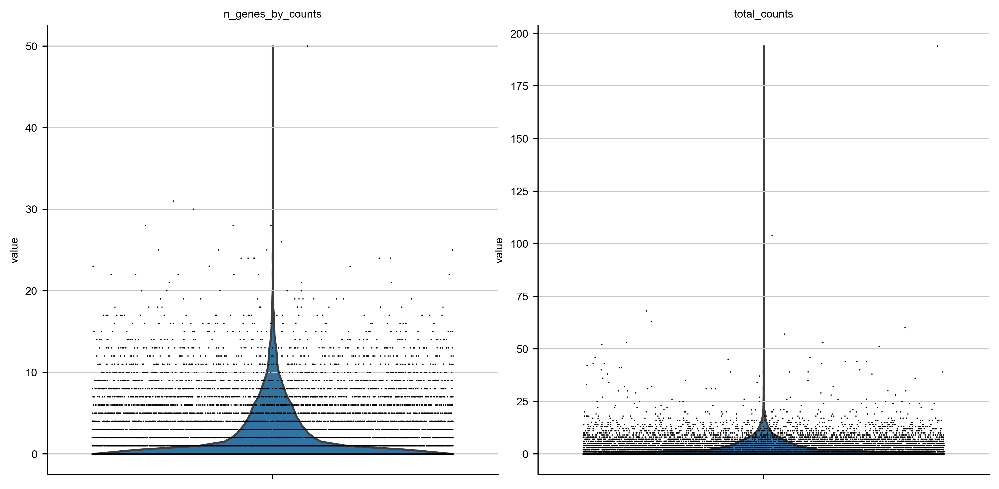

In [31]:
# A violin plot of some of the computed quality measures:
# - the number of genes expressed in the count matrix
# - the total counts per cell
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True)

In [32]:
adata.obs

,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y,n_genes_by_counts,total_counts
Unnamed: 0,,,,,,,,,,
102582844443952149730539560067615449465,0,669.967831,-5222.322795,-128.069997,-5228.700195,-5215.945395,-132.562797,-123.577197,0,0.0
104847050368540286328480141787362473016,0,1481.016881,-5148.672193,75.726008,-5158.078993,-5139.265393,67.669208,83.782809,3,3.0
107470020550270576611587818397373638544,0,291.931973,-5030.736190,-62.675995,-5035.282990,-5026.189390,-67.546795,-57.805195,1,1.0
112715338593472255915169534019454733443,0,633.646950,-5168.382194,-10.349994,-5172.982994,-5163.781394,-16.894794,-3.805194,7,7.0
114094420286822297093500972938678171715,0,117.760567,-5014.644190,22.374007,-5019.946990,-5009.341390,19.393207,25.354807,0,0.0
...,...,...,...,...,...,...,...,...,...,...
91292931842166708506437990165524118949,80,655.737517,-3048.202000,1363.618049,-3056.366800,-3040.037199,1357.721249,1369.514849,0,0.0
92757533981270086717566844337143156729,80,374.531643,-2842.677994,1526.590053,-2845.118794,-2840.237194,1514.105253,1539.074854,0,0.0
9287361901505900312776474068620855544,80,132.874662,-3055.222000,1421.938051,-3059.606800,-3050.837200,1419.281250,1424.594851,0,0.0


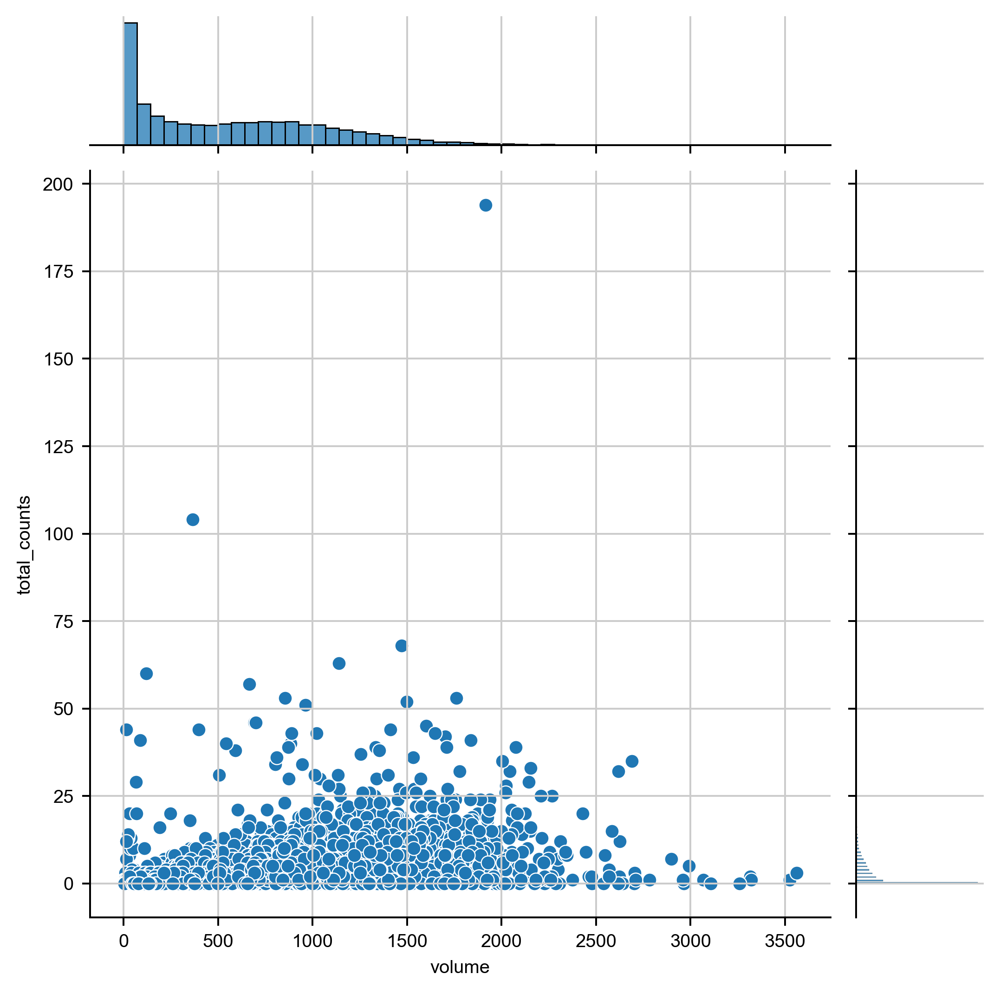

In [10]:
sns.jointplot(data=adata.obs, x='volume', y='total_counts')

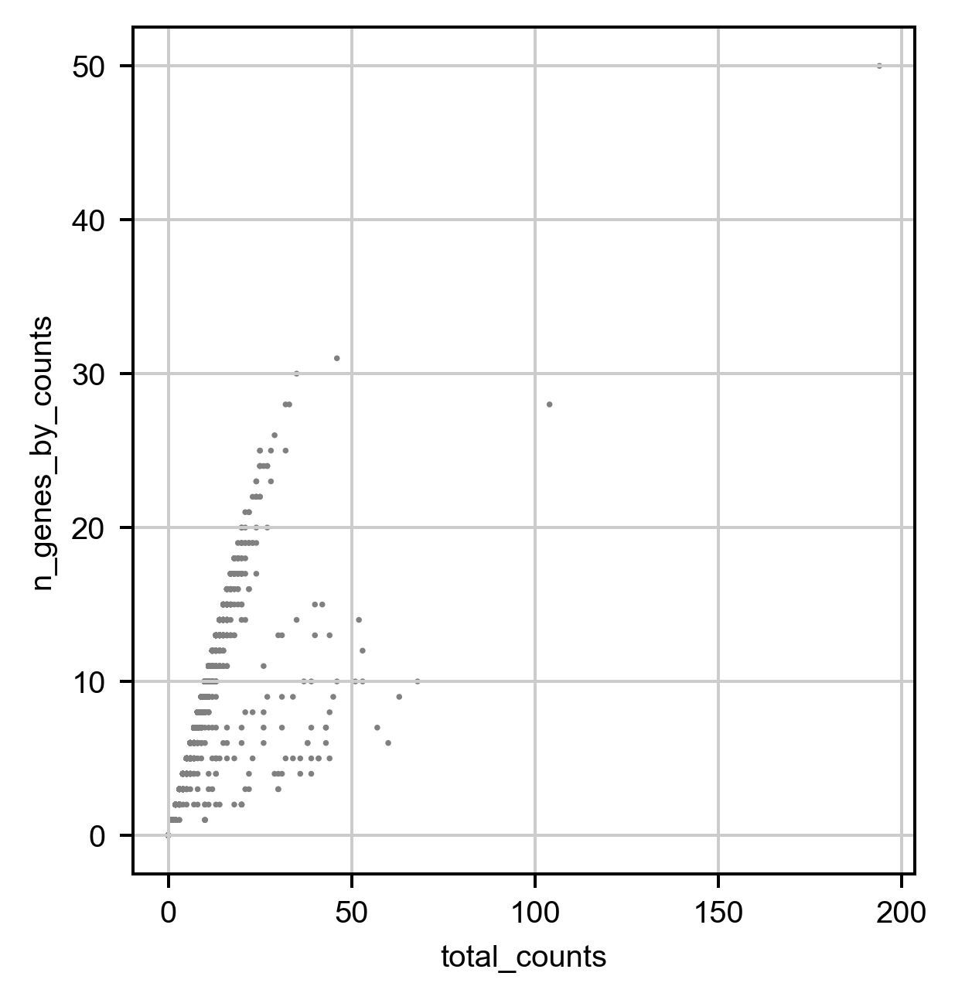

In [11]:
# Plot the distributions of gene counts
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [13]:
adata = adata[adata.obs['total_counts'] > 50]
#adata = adata[adata.obs['n_genes_by_counts'] > 25]

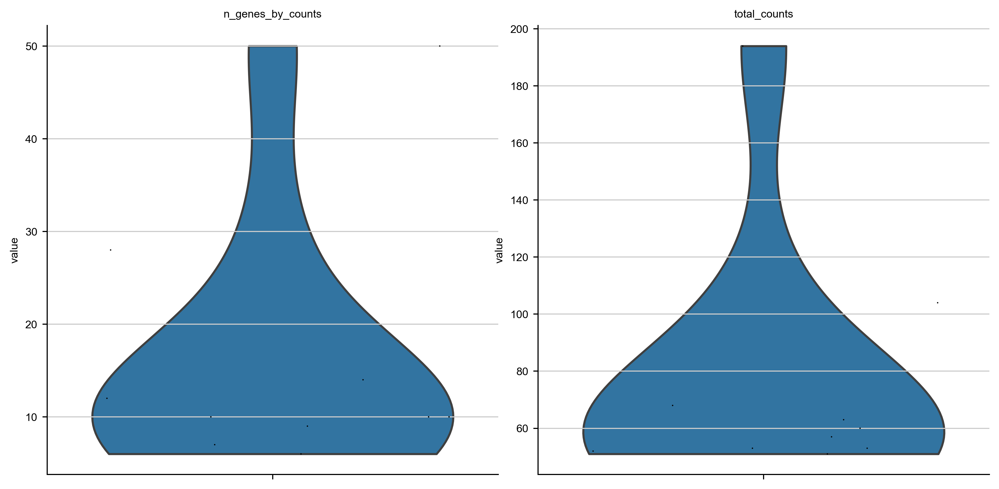

In [14]:
# A violin plot of some of the computed quality measures:
# - the number of genes expressed in the count matrix
# - the total counts per cell
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True)

E:\Users\puzheng\AppData\anaconda3\lib\site-packages\scanpy\preprocessing\_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


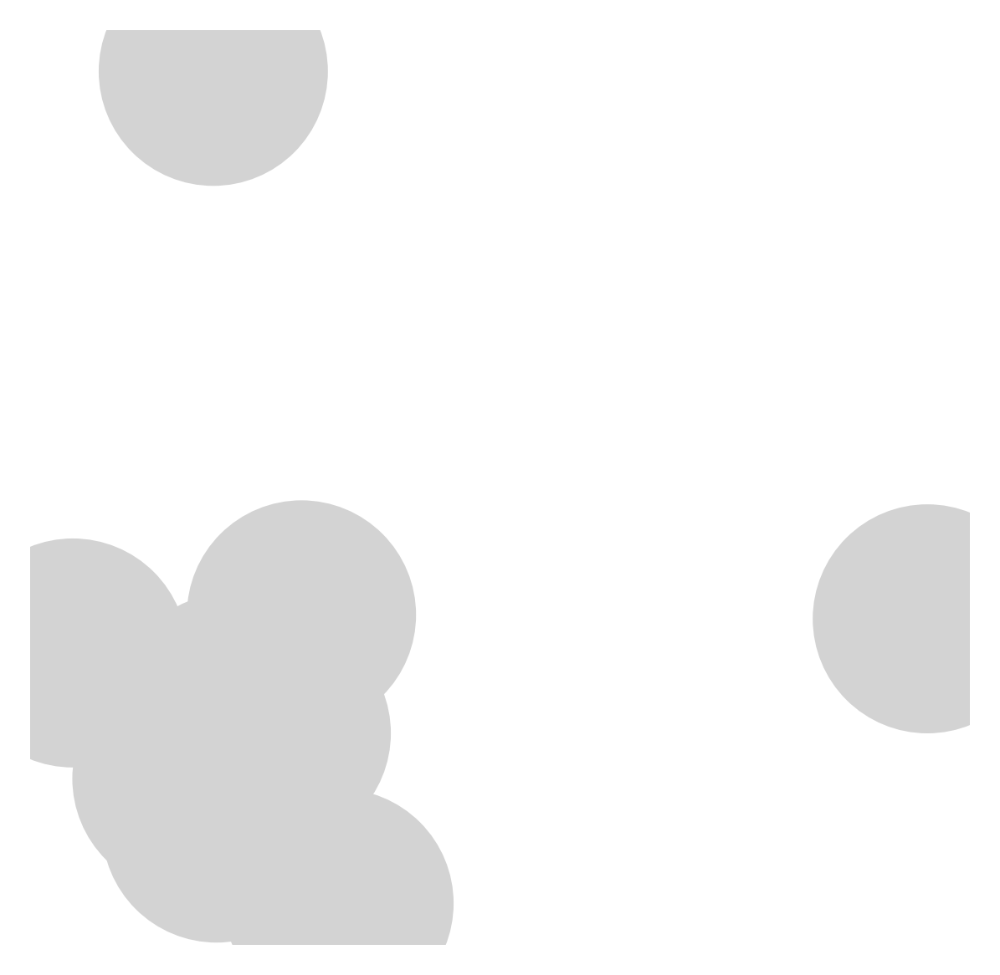

In [15]:
# Total-count normalize (library-size correct) the data matrix to 10,000 reads per cell
sc.pp.normalize_total(adata, target_sum=1e4)
# Logarithmize the data
sc.pp.log1p(adata)
# Regress out total counts
sc.pp.regress_out(adata, 'total_counts')
# Convert gene expressions to Z-scores
sc.pp.scale(adata, max_value=10)
# Principal component analysis
sc.tl.pca(adata, svd_solver='arpack')
# Plot the PCA results
sc.pl.pca(adata)

In [22]:
%%time
# Computing the neighborhood graph
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=5)

Wall time: 306 ms


In [23]:
%%time
# Clustering
sc.tl.leiden(adata, resolution=2)

Wall time: 3 ms


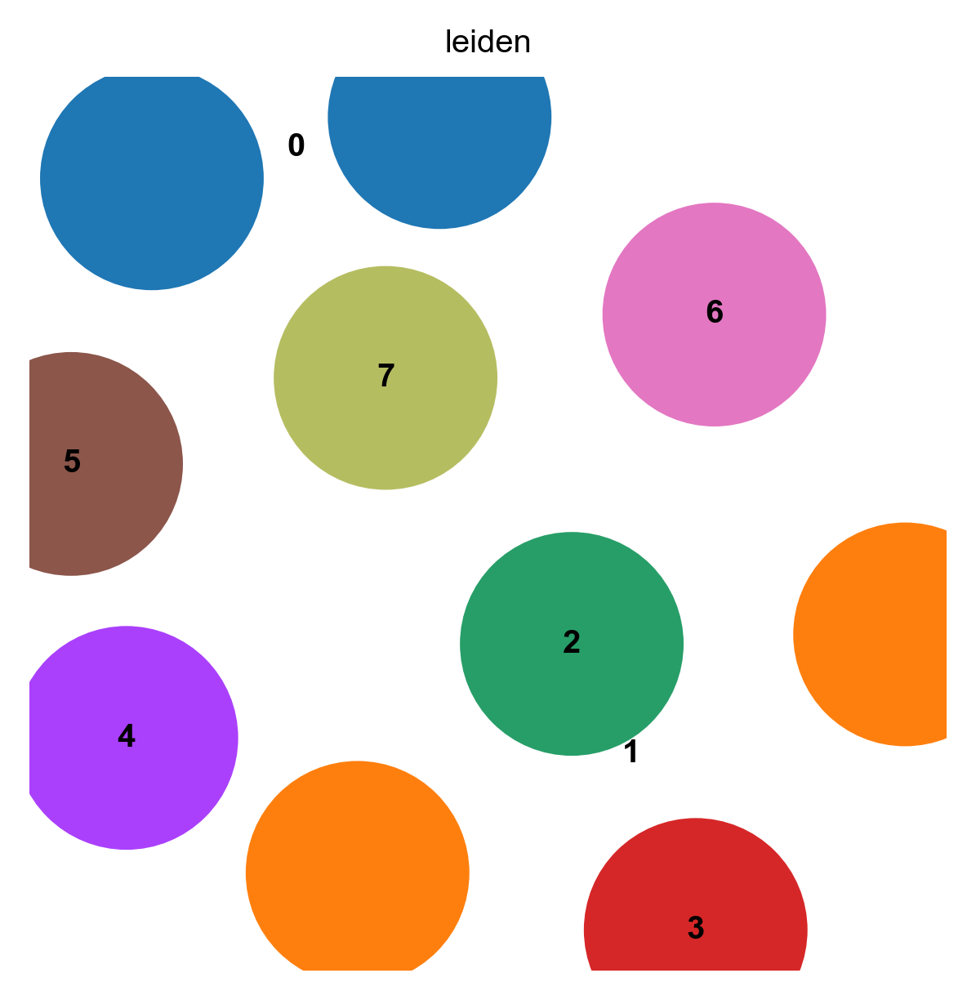

Wall time: 1.43 s


In [24]:
%%time
# Embed with UMAP
sc.tl.umap(adata)
# Plot the UMAP
sc.pl.umap(adata, color='leiden', legend_loc='on data')

In [25]:
adata.obs

,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y,n_genes_by_counts,total_counts,leiden
Unnamed: 0,,,,,,,,,,,
307603136692923611383846140573217515974,6,1761.621010,-4942.699998,100.420000,-4955.022799,-4930.377198,89.069200,111.770801,12,53.0,1
210139418913929251812716161819035543892,9,853.486534,-4574.017897,189.736003,-4582.290697,-4565.745097,181.409202,198.062803,10,53.0,2
305256225799923774437790952180523047754,10,961.386587,-4577.473897,414.400009,-4585.746697,-4569.201097,407.585209,421.214809,10,51.0,3
122527749558184800916434893691608415008,30,1497.070045,-3272.311946,-756.999973,-3280.962746,-3263.661146,-766.730773,-747.269172,14,52.0,4
228759620898984387209116529160085457268,47,1138.027846,-3160.173946,107.724003,-3168.014746,-3152.333146,99.289203,116.158803,9,63.0,0
302532984204808904041255719094991200666,57,364.076849,-3049.727998,373.258010,-3054.922798,-3044.533197,368.333210,378.182810,28,104.0,0
124187483609278717358126806978949017270,66,665.012264,-3515.141995,1686.554003,-3523.414795,-3506.869194,1681.521203,1691.586803,7,57.0,5
311206970642055139743490248175994751014,67,119.625640,-3516.977995,1911.857954,-3519.634795,-3514.321195,1905.637154,1918.078754,6,60.0,6
112463201510350448732250823906151153225,71,1471.870439,-3294.752043,1683.152003,-3306.210844,-3283.293243,1669.101202,1697.202803,10,68.0,7


<AxesSubplot:xlabel='center_x', ylabel='center_y'>

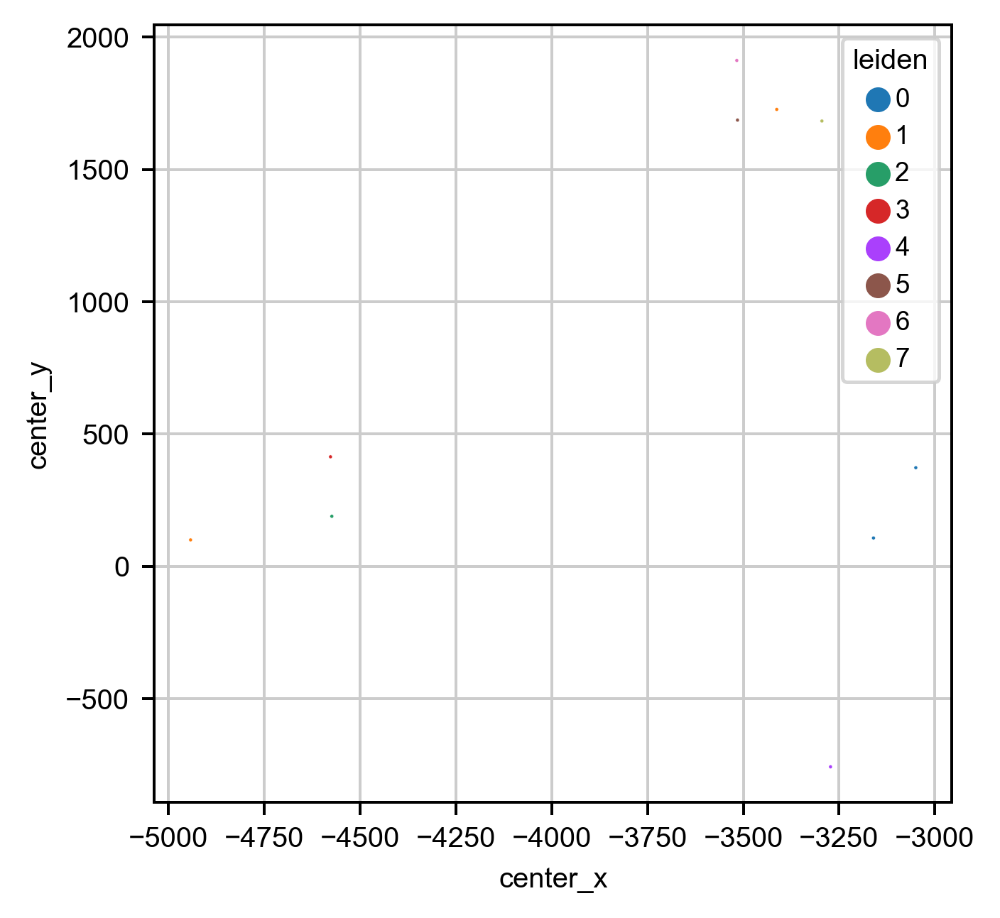

In [26]:
sns.scatterplot(data=adata.obs, x='center_x', y='center_y', hue='leiden', s=1)

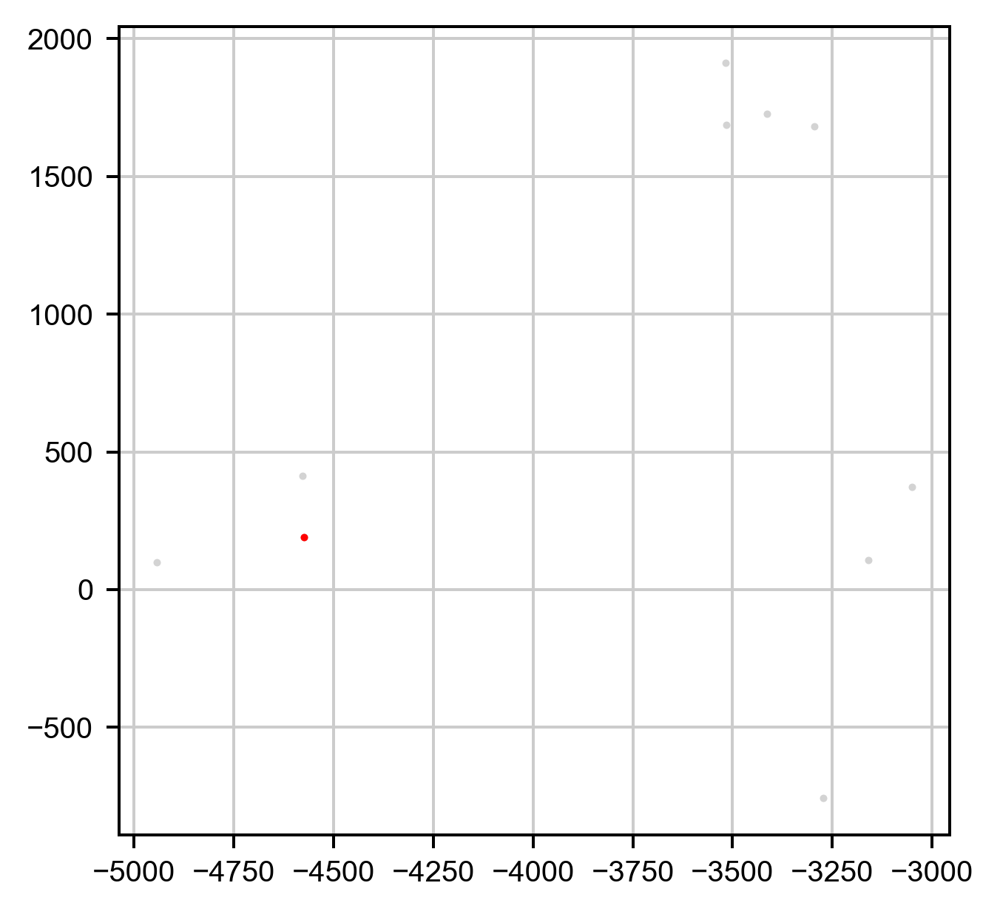

In [27]:
import matplotlib.pyplot as plt

plt.scatter(adata.obs['center_x'], adata.obs['center_y'], c='lightgrey', s=1)

df = adata.obs[adata.obs['leiden'] == '2']
plt.scatter(df['center_x'], df['center_y'], c='red', s=1)

KeyError: 'Could not find key log_total_counts in .var_names or .obs.columns.'

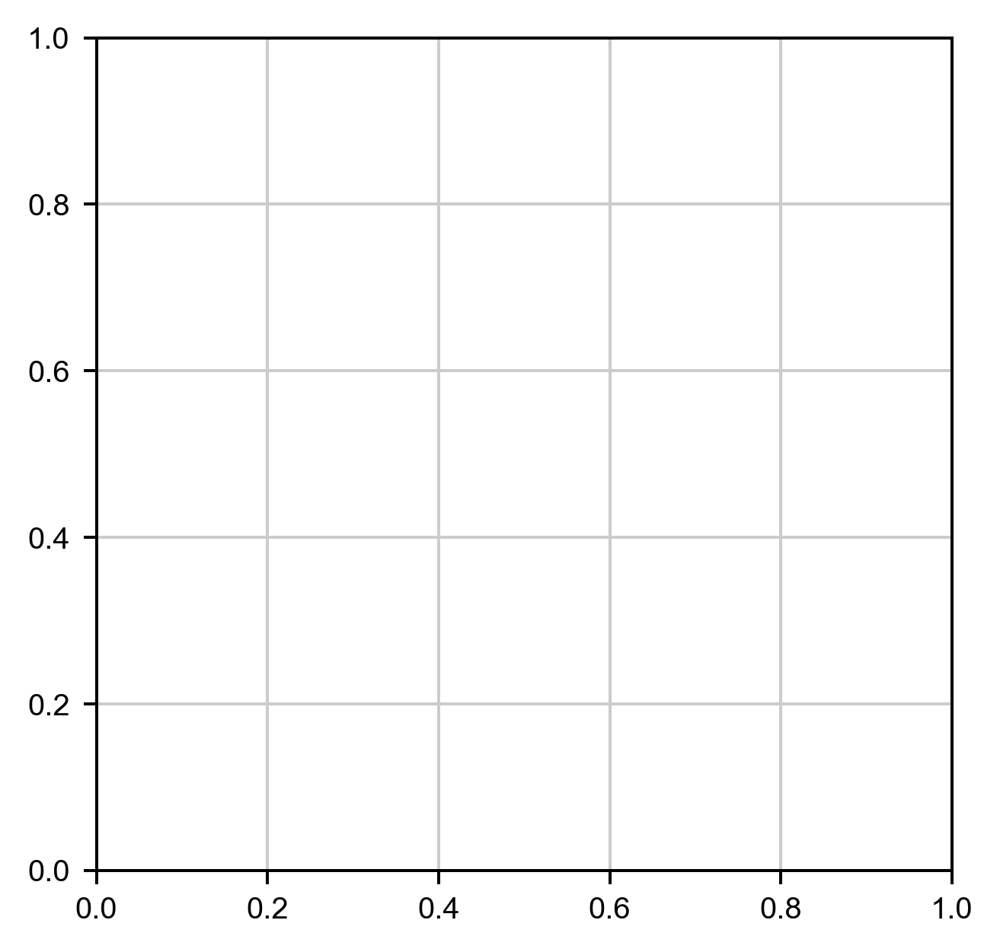

In [28]:
sc.pl.umap(adata, color='log_total_counts')

In [19]:
marker_genes = ['Slc17a7', 'Slc32a1', 'Slc30a3', 'Cux2', 'Rorb', 'Sulf2', 'Ptpru', 'Car3', 'Fam84b', 'Syt6', 
               'Nxph4', 'Tshz2', 'Pvalb', 'Sst', 'Vip', 'Sncg', 'Lamp5', 'Sox10', 'Pdgfra', 'Aqp4', 'Igf2',
               'Ctss', 'Cldn5', 'Flt1', 'Bgn', 'Vtn']
marker_genes = [g for g in marker_genes if (g in adata.var.index)]

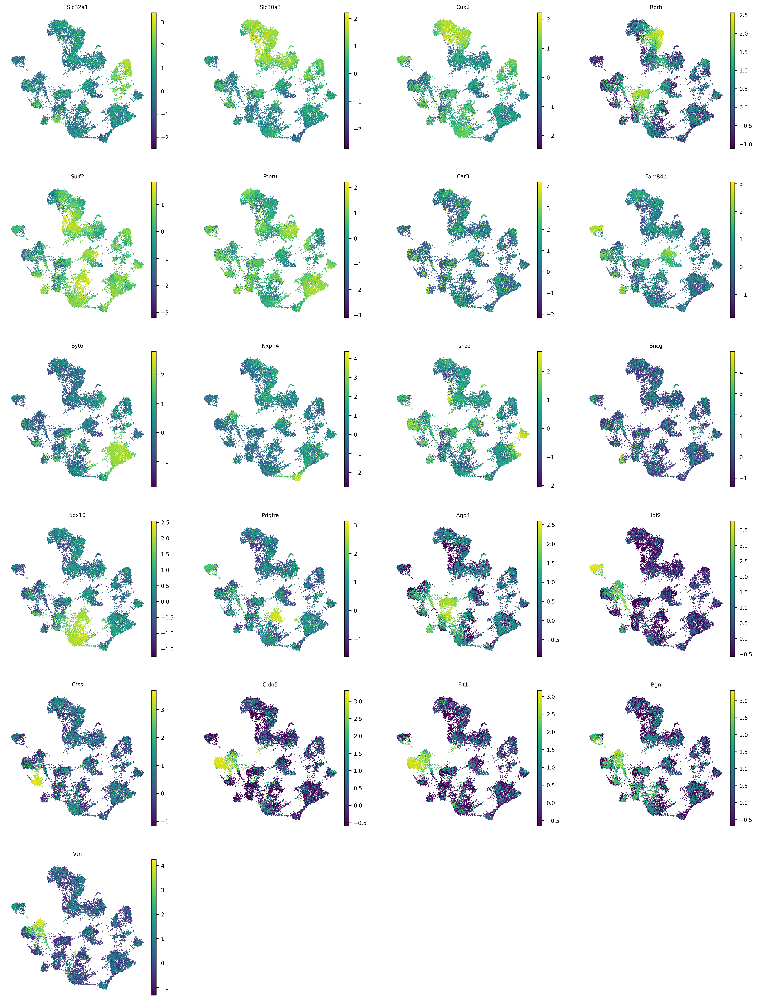

In [20]:
sc.pl.umap(adata, color=marker_genes)